<a href="https://colab.research.google.com/github/Witold21/WDN/blob/main/DLa%20strategicznmych.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [53]:
%pip install epyt pymoo
%pip install numpy==1.23
!git clone https://github.com/Witold21/WDN.git
import os
os.chdir('/content/WDN/EPYT')
!ls

fatal: destination path 'WDN' already exists and is not an empty directory.
 enQXfT8A		      epytflow_leakagedetection.ipynb		    Walkerton_v1_temp.inp
 enxQBbq5		      epyt_leakage_simulation_and_detection.ipynb   Walkerton_v1_temp.txt
 enZNNJwB		      epyt_pressure_sensor_placement.ipynb	    Walkerton_v1.txt
 epyt_epanet_analysis.ipynb   REQUIREMENTS.txt				    WDN
'epy testy.ipynb'	      Walkerton_v1.inp


In [54]:
from epyt import epanet
import numpy as np
from pymoo.core.problem import Problem
from pymoo.algorithms.soo.nonconvex.ga import GA
from pymoo.optimize import minimize
from pymoo.operators.sampling.rnd import IntegerRandomSampling
from pymoo.operators.crossover.sbx import SimulatedBinaryCrossover
from pymoo.operators.mutation.pm import PolynomialMutation
from pymoo.operators.repair.rounding import RoundingRepair
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import math

In [55]:
d=epanet('Walkerton_v1.inp')

EPANET version 20200 loaded (EPyT version v1.2.0 - Last Update: 01/08/2024).
Input File Walkerton_v1.inp loaded successfully.



In [56]:
import warnings
# Ignorowanie ostrzeżeń użytkownika (warnings)
warnings.filterwarnings('ignore')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [57]:
d.setTimeSimulationDuration(2 * 24 * 60 * 60)  # greater weight to low demand hours
d.setTimePatternStart(0)  # in seconds

In [58]:
allleaknodes = ['J155' , 'J236', 'J189', 'J85']
num_valves  = 10
restricted_pipes= [359,360,361, 363,349,354]

In [59]:
all_links = d.getLinkIndex()
all_nodes = d.getNodeIndex()
all_links = [63, 14, 24, 179, 199, 301, 302, 128, 83, 346, 37, 243, 244, 203, 75, 322, 232, 68,
             73, 78, 84, 90, 96, 98, 208, 345, 111, 112, 124, 116, 174, 120, 233, 126, 129, 155, 132, 133, 204, 266, 282]

In [60]:
def DaneZSymulacji():
      data = d.getComputedHydraulicTimeSeries(['Time', 'Pressure'])
      time = data.Time
      pressure = data.Pressure
      pressure = np.mean(pressure, axis=1)
      pressure = pressure[:, np.newaxis]
      pressure = pressure.ravel()
      pressure_time = np.column_stack((time, pressure))
      return pressure_time

In [61]:
def WspolnyCzas(presTime1, pressTime2):
    common_times = np.intersect1d(presTime1[:, 0], pressTime2[:, 0])
    filtered_no_leak = np.array([row for row in presTime1 if row[0] in common_times])
    filtered_leak = np.array([row for row in pressTime2 if row[0] in common_times])
    return filtered_no_leak, filtered_leak

In [62]:
def OdlegloscEuklidesa(pressure_time1, pressure_time2):
    squared_differences = [
        (row1[1] - row2[1]) ** 2
        for row1, row2 in zip(pressure_time1, pressure_time2)]
    sum_squared_differences = sum(squared_differences)
    wskaznik = math.sqrt(sum_squared_differences)
    return wskaznik

In [63]:
def WykresZaworu(pressure_time1, pressure_time2, pressure_time3):
    x_leak_pipe = [row[0] for row in pressure_time1]
    y_leak_pipe = [row[1] for row in pressure_time1]

    x_no_leak = [row[0] for row in pressure_time2]
    y_no_leak = [row[1] for row in pressure_time2]

    x_leak = [row[0] for row in pressure_time3]
    y_leak = [row[1] for row in pressure_time3]

    plt.figure(figsize=(12, 6))
    plt.plot(x_leak_pipe, y_leak_pipe, label='Ciśnienie z wyciekiem i zaworem', color='blue', linestyle='-', marker='o')
    plt.plot(x_no_leak, y_no_leak, label='Ciśnienie bez wycieku', color='red', linestyle='-', marker='x')
    plt.plot(x_leak, y_leak, label='Ciśnienie z wyciekem', color='green', linestyle='-', marker='x')

    plt.title('Ciśnienie w czasie (z wyciekiem vs bez wycieku)')
    plt.xlabel('Czas [s]')
    plt.ylabel('Ciśnienie [jednostka]')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [64]:
def WykresResiduum(pressure_time1, pressure_time2, pressure_time3):
    # Wyciąganie danych
    x_leak_pipe = [row[0] for row in pressure_time1]
    y_leak_pipe = [row[1] for row in pressure_time1]

    x_no_leak = [row[0] for row in pressure_time2]
    y_no_leak = [row[1] for row in pressure_time2]

    x_leak = [row[0] for row in pressure_time3]
    y_leak = [row[1] for row in pressure_time3]

    # Obliczanie różnic ciśnień
    diff_leak_pipe_no_leak = [abs(y1 - y2) for y1, y2 in zip(y_leak_pipe, y_no_leak)]
    diff_leak_no_leak = [abs(y1 - y2) for y1, y2 in zip(y_leak, y_no_leak)]
    plt.figure(figsize=(12, 6))
    # Wykres różnicy: Z wyciekiem i zaworem - Bez wycieku
    plt.plot(x_leak_pipe, diff_leak_pipe_no_leak, label='Różnica: Z wyciekiem i zaworem - Bez wycieku', color='blue', linestyle='-', marker='o')

    # Wykres różnicy: Z wyciekiem - Bez wycieku
    plt.plot(x_leak, diff_leak_no_leak, label='Różnica: Z wyciekiem - Bez wycieku', color='green', linestyle='-', marker='x')

    # Dodatkowe ustawienia wykresu
    plt.title('Różnice ciśnienia w czasie')
    plt.xlabel('Czas [s]')
    plt.ylabel('Różnica ciśnienia [jednostka]')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [65]:
pressure_time_no_leak = DaneZSymulacji()

wskaznik dla wycieku bez zaworów: 14.590735868671725

Placing valve 1...
wskaznik_best: 14.590735868671725

pipe: 63
wskaznik: 14.590898427006135

pipe: 14
wskaznik: 14.90453066522504

pipe: 24
wskaznik: 14.608809192092128

pipe: 179
wskaznik: 11024.657450100447

pipe: 199
wskaznik: 32.746378543628744

pipe: 301
wskaznik: 28.478706609650132

pipe: 302
wskaznik: 28.502164121619934

pipe: 128
wskaznik: 334946.00189665414

pipe: 83
wskaznik: 14.591975821898702

pipe: 346
wskaznik: 15.294997970824792

pipe: 37
wskaznik: 410.80329634291496

pipe: 243
wskaznik: 14.590728537867482
Pick_me_pipe: 243

pipe: 244
wskaznik: 14.591782263971348

pipe: 203
wskaznik: 14784.508015340814

pipe: 75
wskaznik: 15.155102628369944

pipe: 322
wskaznik: 14.668683187798974

pipe: 232
wskaznik: 722.659667518813

pipe: 68
wskaznik: 11426.870739268295

pipe: 73
wskaznik: 14.629916581904476

pipe: 78
wskaznik: 15.076898500304921

pipe: 84
wskaznik: 14.598933742592312

pipe: 90
wskaznik: 14.580761665814007
Pick_me_p

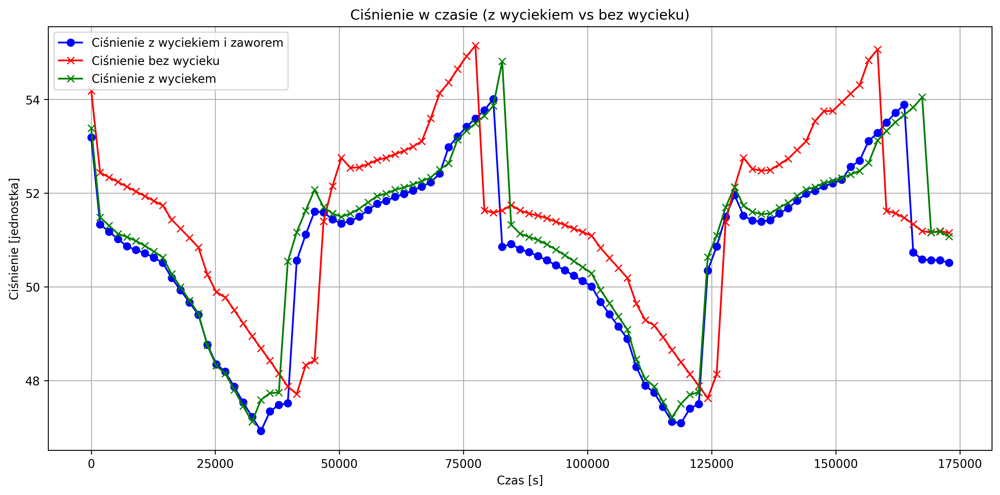

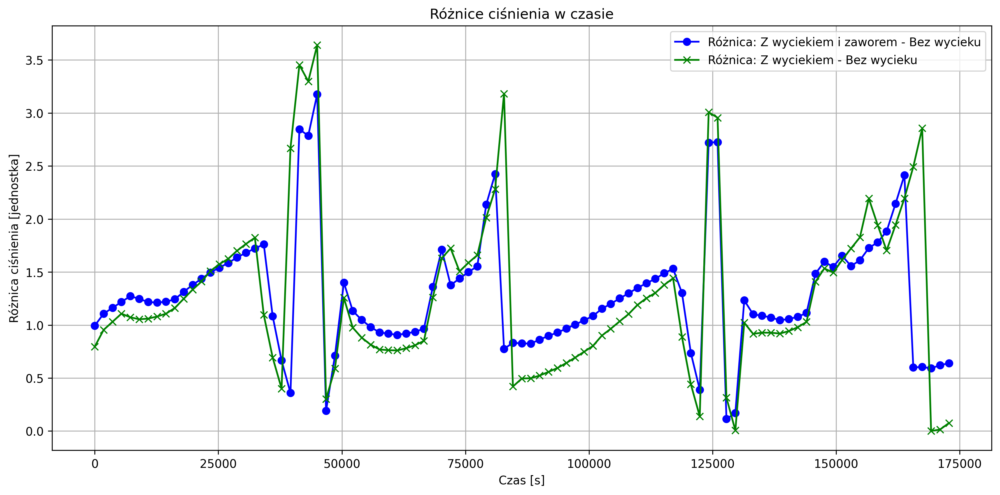

[124]

Placing valve 2...
wskaznik_best: 13.810652609510594

pipe: 63
wskaznik: 13.811082755254382

pipe: 14
wskaznik: 13.957733386556926

pipe: 24
wskaznik: 13.926545909972129

pipe: 179
wskaznik: 11026.478329464964

pipe: 199
wskaznik: 30.97988291031395

pipe: 301
wskaznik: 27.979168959923054

pipe: 302
wskaznik: 27.999856268104228

pipe: 128
wskaznik: 334947.8244921982

pipe: 83
wskaznik: 13.824571291810193

pipe: 346
wskaznik: 14.085631531685163

pipe: 37
wskaznik: 456.08948046137107

pipe: 243
wskaznik: 13.810991018568686

pipe: 244
wskaznik: 13.810337920778935
Pick_me_pipe: 244

pipe: 203
wskaznik: 14786.329350392762

pipe: 75
wskaznik: 13.834469898572475

pipe: 322
wskaznik: 13.864209306970018

pipe: 232
wskaznik: 724.452507492304

pipe: 68
wskaznik: 11428.691555900134

pipe: 73
wskaznik: 13.846791086431104

pipe: 78
wskaznik: 13.808111268641168
Pick_me_pipe: 78

pipe: 84
wskaznik: 13.798846252896297
Pick_me_pipe: 84

pipe: 90
wskaznik: 13.824801501702508

pipe: 96
wskaznik: 13.

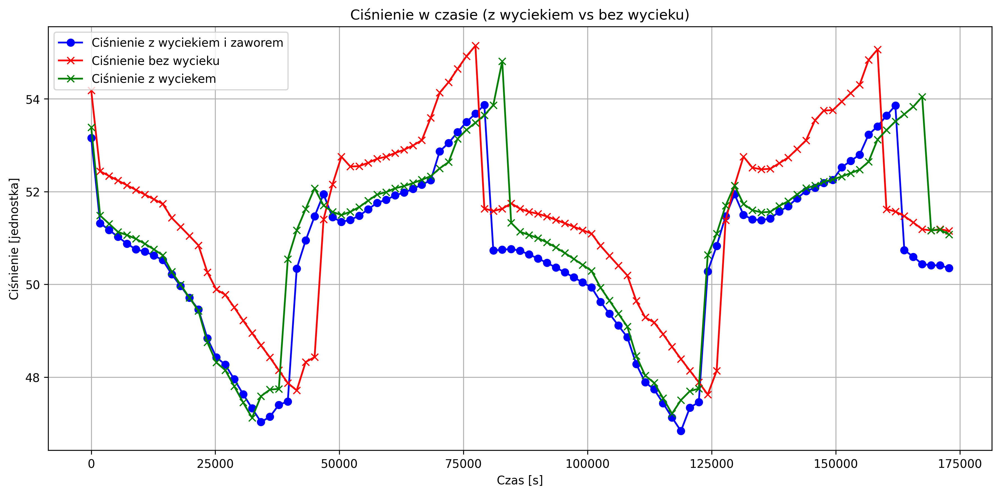

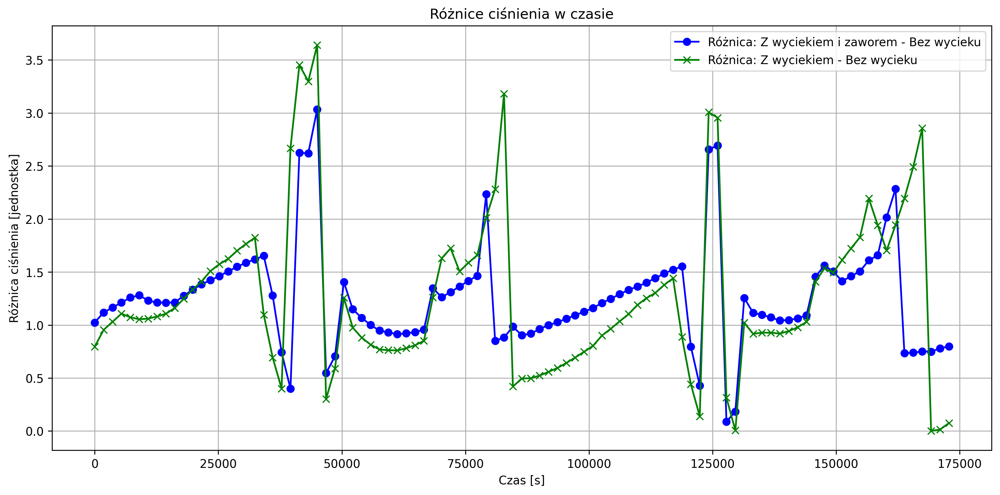

[124, 155]

Placing valve 3...
wskaznik_best: 13.292451727185979

pipe: 63
wskaznik: 13.292540416515093

pipe: 14
wskaznik: 33.914654616632866

pipe: 24
wskaznik: 13.082631678024367
Pick_me_pipe: 24

pipe: 179
wskaznik: 11026.902876784134

pipe: 199
wskaznik: 32.02086724484131

pipe: 301
wskaznik: 28.01345953409606

pipe: 302
wskaznik: 28.02826140435111

pipe: 128
wskaznik: 334948.24928097223

pipe: 83
wskaznik: 13.291616290024841

pipe: 346
wskaznik: 13.79121210710717

pipe: 37
wskaznik: 475.94238280961616

pipe: 243
wskaznik: 13.29255150236468

pipe: 244
wskaznik: 13.291823672030459

pipe: 203
wskaznik: 14786.754174742298

pipe: 75
wskaznik: 13.527057277086833

pipe: 322
wskaznik: 13.352897773200558

pipe: 232
wskaznik: 724.8641855866503

pipe: 68
wskaznik: 11429.116332425952

pipe: 73
wskaznik: 13.333662483485554

pipe: 78
wskaznik: 13.277108181405486

pipe: 84
wskaznik: 13.498789068090074

pipe: 90
wskaznik: 13.081536988008551
Pick_me_pipe: 90

pipe: 96
wskaznik: 13.292149237485372

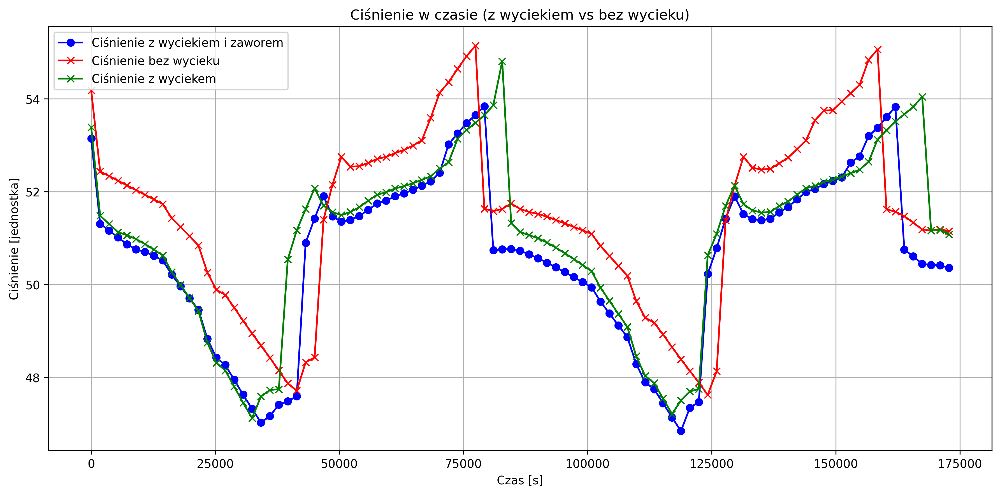

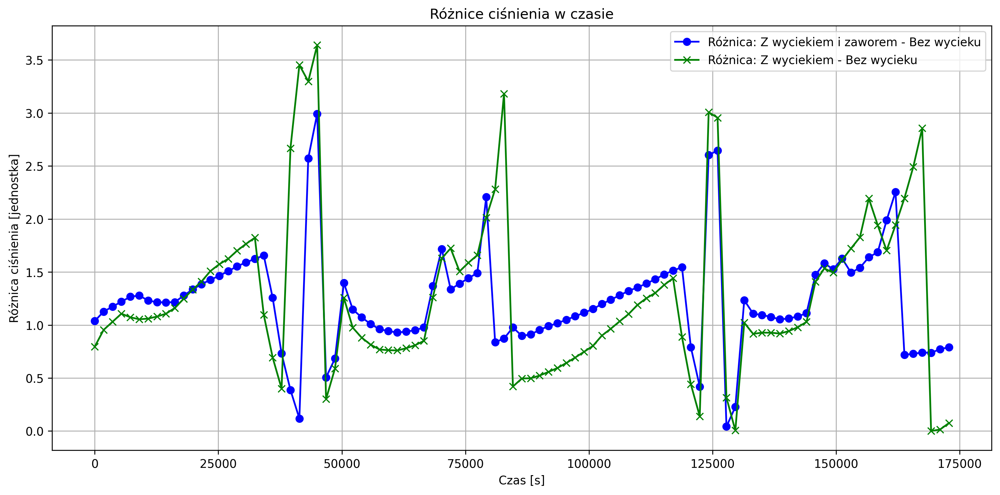

[124, 155, 90]

Placing valve 4...
wskaznik_best: 13.081536988008551

pipe: 63
wskaznik: 13.082013096138114

pipe: 14
wskaznik: 33.24051224582723

pipe: 24
wskaznik: 13.35507272866714

pipe: 179
wskaznik: 11027.225111937696

pipe: 199
wskaznik: 32.517630716634926

pipe: 301
wskaznik: 28.402492995204746

pipe: 302
wskaznik: 28.425449931845765

pipe: 128
wskaznik: 334948.5721990771

pipe: 83
wskaznik: 13.20620481266941

pipe: 346
wskaznik: 13.906271083232767

pipe: 37
wskaznik: 475.7167783871224

pipe: 243
wskaznik: 13.081970177757102

pipe: 244
wskaznik: 13.079654800303885
Pick_me_pipe: 244

pipe: 203
wskaznik: 14787.07654849798

pipe: 75
wskaznik: 13.244441574169626

pipe: 322
wskaznik: 13.424229176835505

pipe: 232
wskaznik: 725.1797377903388

pipe: 68
wskaznik: 11429.438614764846

pipe: 73
wskaznik: 13.39687336650502

pipe: 78
wskaznik: 13.187883940879296

pipe: 84
wskaznik: 13.261336096304015

pipe: 90

pipe: 96
wskaznik: 13.083014559037126

pipe: 98
wskaznik: 263314.29903883004

pi

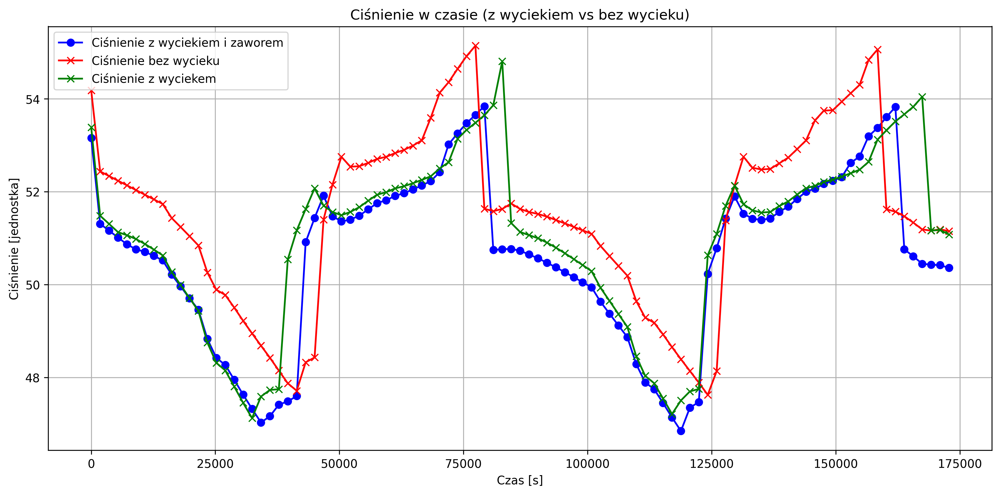

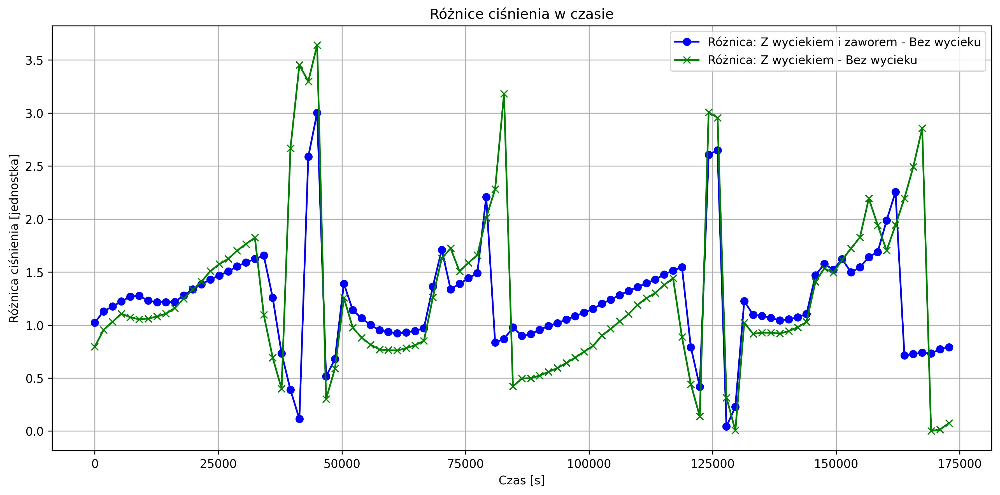

[124, 155, 90, 111]

Placing valve 5...
wskaznik_best: 13.072599520912052

pipe: 63
wskaznik: 13.072619251360587

pipe: 14
wskaznik: 32.35248792782454

pipe: 24
wskaznik: 12.864347759366341
Pick_me_pipe: 24

pipe: 179
wskaznik: 11027.21092770053

pipe: 199
wskaznik: 32.36398836157302

pipe: 301
wskaznik: 28.542665124112236

pipe: 302
wskaznik: 28.547797703479535

pipe: 128
wskaznik: 334948.558158906

pipe: 83
wskaznik: 12.991243289869331

pipe: 346
wskaznik: 13.902808993718633

pipe: 37
wskaznik: 475.6655739018601

pipe: 243
wskaznik: 13.072590464092226

pipe: 244
wskaznik: 13.292597518523303

pipe: 203
wskaznik: 14787.062297596665

pipe: 75
wskaznik: 13.257154465854741

pipe: 322
wskaznik: 13.404049401170777

pipe: 232
wskaznik: 725.1655244521233

pipe: 68
wskaznik: 11429.424400127737

pipe: 73
wskaznik: 13.377860241383882

pipe: 78
wskaznik: 13.180652622054339

pipe: 84
wskaznik: 13.253839255475024

pipe: 90

pipe: 96
wskaznik: 13.072220412957618

pipe: 98
wskaznik: 263314.2848872983

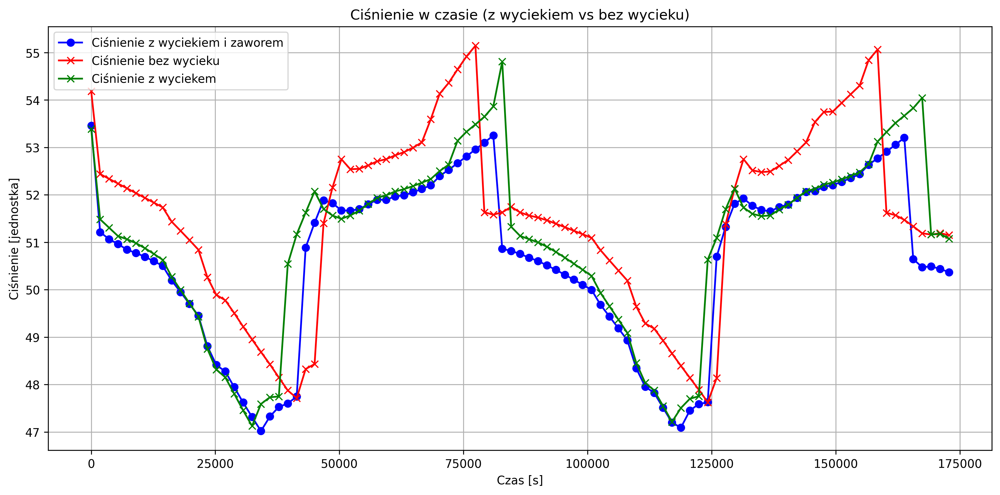

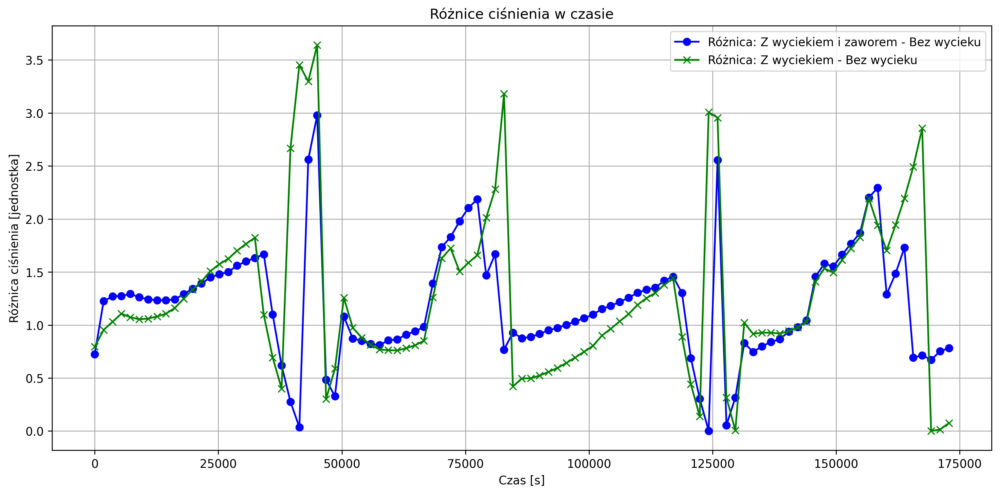

[124, 155, 90, 111, 24]

Placing valve 6...
wskaznik_best: 12.864347759366341

pipe: 63
wskaznik: 12.865534412728437

pipe: 14
wskaznik: 19.156011813407538

pipe: 24

pipe: 179
wskaznik: 11027.346175054996

pipe: 199
wskaznik: 109.62397363102427

pipe: 301
wskaznik: 40.16981519340268

pipe: 302
wskaznik: 40.4723873589926

pipe: 128
wskaznik: 334948.69256060274

pipe: 83
wskaznik: 12.950266404270467

pipe: 346
wskaznik: 14.185031086067816

pipe: 37
wskaznik: 469.85308458611075

pipe: 243
wskaznik: 12.864330170688056
Pick_me_pipe: 243

pipe: 244
wskaznik: 12.88283590636172

pipe: 203
wskaznik: 14787.19761916091

pipe: 75
wskaznik: 13.17438462526398

pipe: 322
wskaznik: 12.87861854538137

pipe: 232
wskaznik: 725.2960197106767

pipe: 68
wskaznik: 11429.559659590679

pipe: 73
wskaznik: 12.956548902388876

pipe: 78
wskaznik: 13.075293066965878

pipe: 84
wskaznik: 12.840095094089286
Pick_me_pipe: 84

pipe: 90

pipe: 96
wskaznik: 12.864152929491096

pipe: 98
wskaznik: 263314.42056812125

pipe:

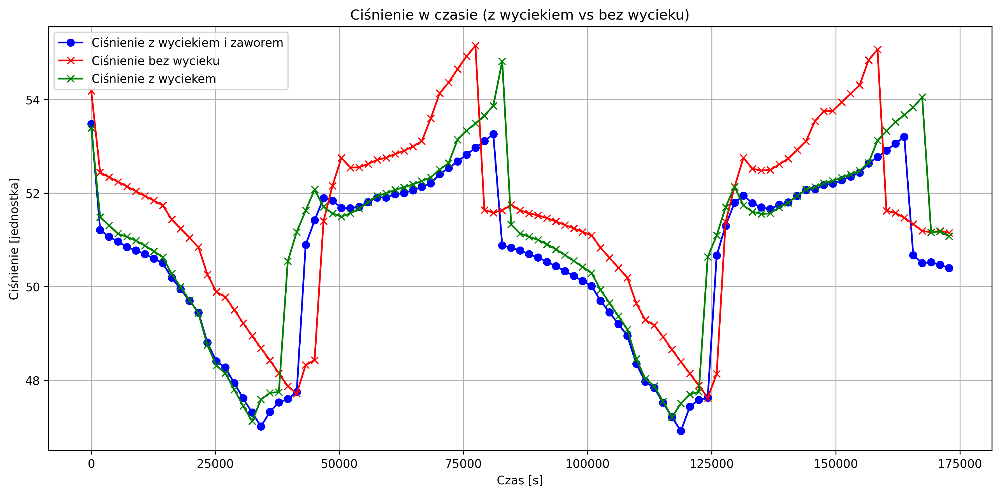

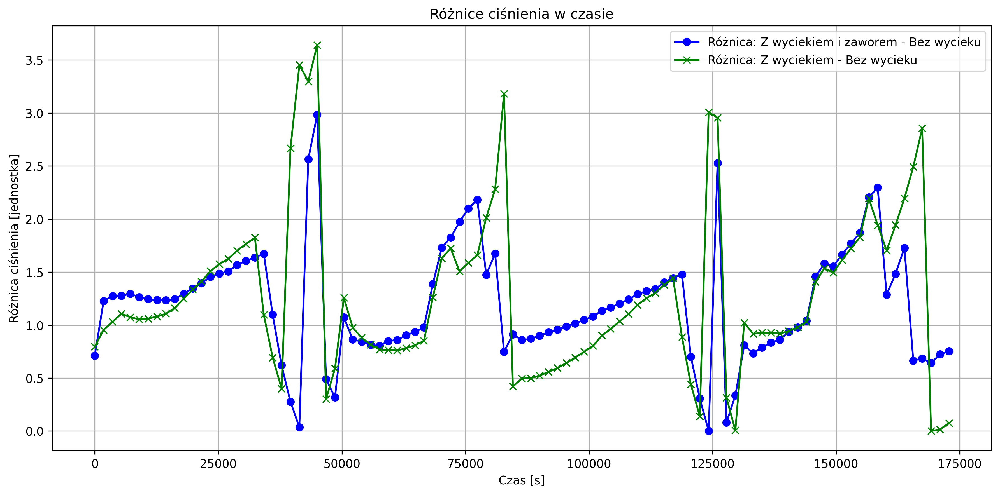

[124, 155, 90, 111, 24, 84]

Placing valve 7...
wskaznik_best: 12.840095094089286

pipe: 63
wskaznik: 12.840804815316732

pipe: 14
wskaznik: 19.708488817445033

pipe: 24

pipe: 179
wskaznik: 11027.3469907724

pipe: 199
wskaznik: 109.63801420041723

pipe: 301
wskaznik: 40.19706104322592

pipe: 302
wskaznik: 40.500132251393154

pipe: 128
wskaznik: 334948.69359603676

pipe: 83
wskaznik: 12.442011627261767
Pick_me_pipe: 83

pipe: 346
wskaznik: 13.960782373298889

pipe: 37
wskaznik: 469.8520497220492

pipe: 243
wskaznik: 12.840059834797541

pipe: 244
wskaznik: 12.837785343318657

pipe: 203
wskaznik: 14787.198358490627

pipe: 75
wskaznik: 13.16273579392799

pipe: 322
wskaznik: 12.86415470614729

pipe: 232
wskaznik: 725.2963681075547

pipe: 68
wskaznik: 11429.560403879022

pipe: 73
wskaznik: 12.923892963289621

pipe: 78
wskaznik: 13.045831168478244

pipe: 84

pipe: 90

pipe: 96
wskaznik: 12.839207305635215

pipe: 98
wskaznik: 263314.42162676685

pipe: 208
wskaznik: 1202305.8148890324

pipe: 3

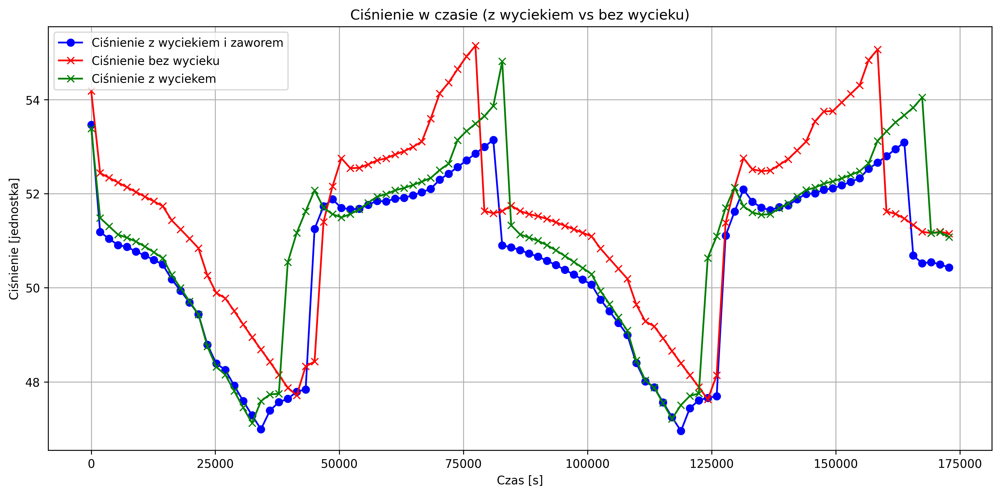

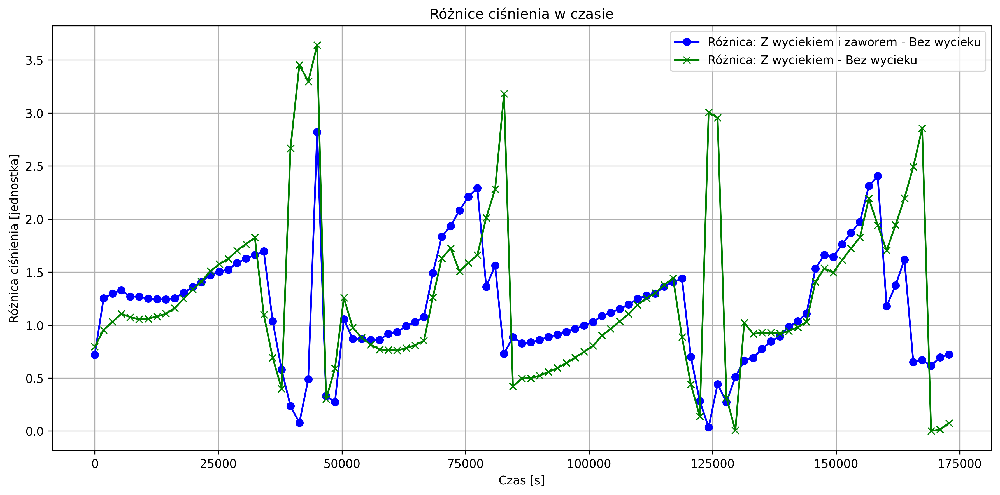

[124, 155, 90, 111, 24, 84, 83]

Placing valve 8...
wskaznik_best: 12.442011627261767

pipe: 63
wskaznik: 12.442974759349333

pipe: 14
wskaznik: 20.29710175086701

pipe: 24

pipe: 179
wskaznik: 11028.180559629654

pipe: 199
wskaznik: 112.55987809072215

pipe: 301
wskaznik: 38.626735661800495

pipe: 302
wskaznik: 38.93346215137304

pipe: 128
wskaznik: 334949.5279322963

pipe: 83

pipe: 346
wskaznik: 14.206560060209783

pipe: 37
wskaznik: 469.4737952161669

pipe: 243
wskaznik: 12.441997028242884
Pick_me_pipe: 243

pipe: 244
wskaznik: 12.44139219994914
Pick_me_pipe: 244

pipe: 203
wskaznik: 14788.032407918496

pipe: 75
wskaznik: 13.192065411793948

pipe: 322
wskaznik: 12.467219248744945

pipe: 232
wskaznik: 726.1148651137995

pipe: 68
wskaznik: 11430.394039426767

pipe: 73
wskaznik: 12.587257509954894

pipe: 78
wskaznik: 12.98568755670669

pipe: 84

pipe: 90

pipe: 96
wskaznik: 12.441460324789194

pipe: 98
wskaznik: 263315.2564407051

pipe: 208
wskaznik: 1202308.7603848942

pipe: 345
wska

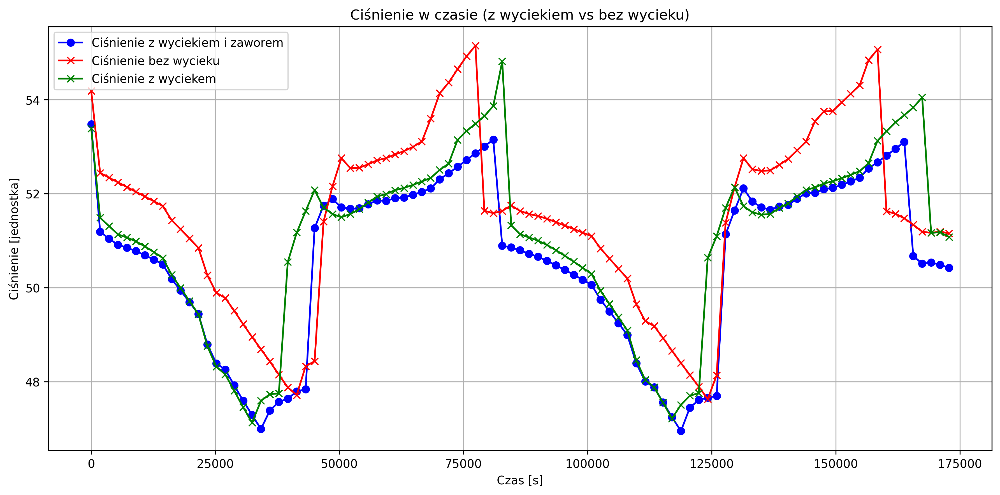

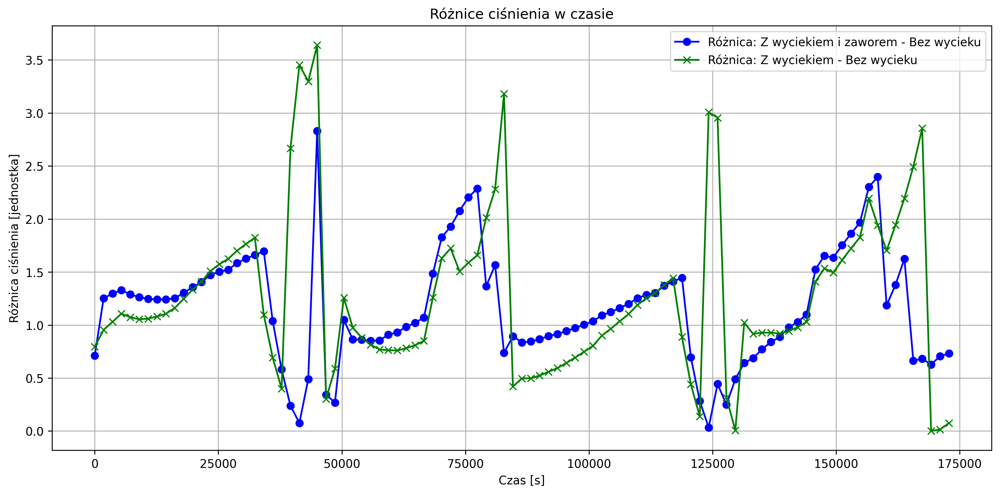

[124, 155, 90, 111, 24, 84, 83, 129]

Placing valve 9...
wskaznik_best: 12.439947016422432

pipe: 63
wskaznik: 12.440946765289954

pipe: 14
wskaznik: 20.278994820926922

pipe: 24

pipe: 179
wskaznik: 11028.167323462898

pipe: 199
wskaznik: 112.57293411312001

pipe: 301
wskaznik: 38.66933465827184

pipe: 302
wskaznik: 38.97556556868101

pipe: 128
wskaznik: 334949.5153314837

pipe: 83

pipe: 346
wskaznik: 14.216052353870491

pipe: 37
wskaznik: 469.4034315915109

pipe: 243
wskaznik: 12.439921639454338
Pick_me_pipe: 243

pipe: 244
wskaznik: 12.43953531544134
Pick_me_pipe: 244

pipe: 203
wskaznik: 14788.019148535815

pipe: 75
wskaznik: 13.19263963941286

pipe: 322
wskaznik: 12.464732327133103

pipe: 232
wskaznik: 726.1017847502915

pipe: 68
wskaznik: 11430.380826631736

pipe: 73
wskaznik: 12.583077002900515

pipe: 78
wskaznik: 12.990327800963035

pipe: 84

pipe: 90

pipe: 96
wskaznik: 12.43943288879944
Pick_me_pipe: 96

pipe: 98
wskaznik: 263315.24326080625

pipe: 208
wskaznik: 1202297.7472

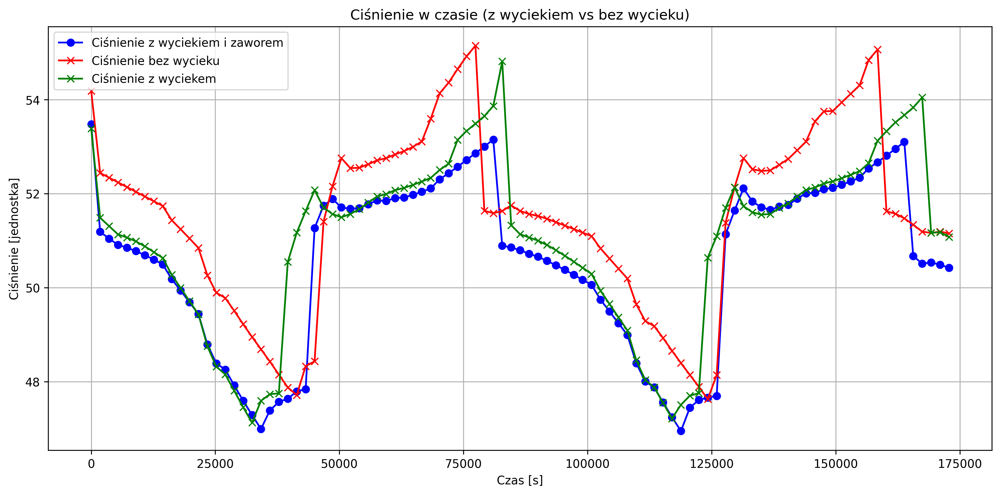

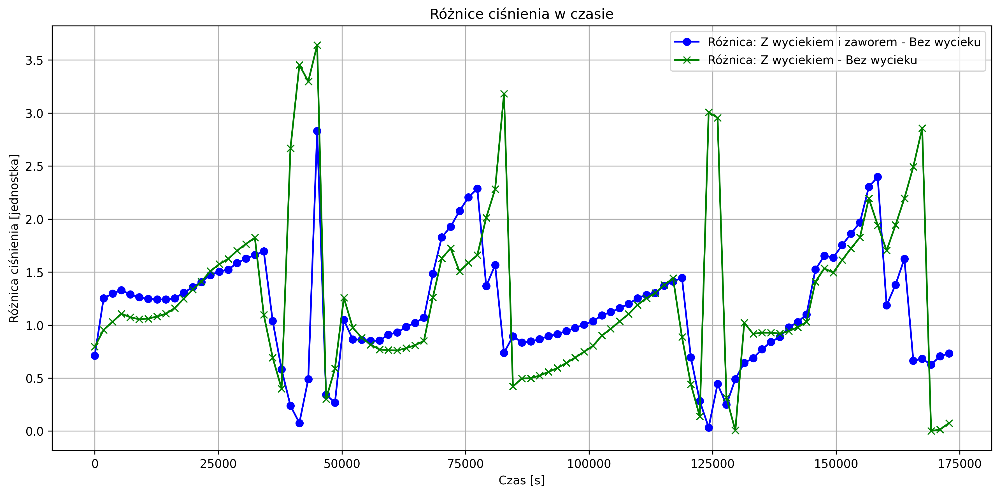

[124, 155, 90, 111, 24, 84, 83, 129, 96]

Placing valve 10...
wskaznik_best: 12.43943288879944

pipe: 63
wskaznik: 12.440186688918837

pipe: 14
wskaznik: 20.278675752653662

pipe: 24

pipe: 179
wskaznik: 11028.166711600612

pipe: 199
wskaznik: 112.57289524958102

pipe: 301
wskaznik: 53.47775434147375

pipe: 302
wskaznik: 54.01613444512771

pipe: 128
wskaznik: 334949.51469156943

pipe: 83

pipe: 346
wskaznik: 14.215277982993708

pipe: 37
wskaznik: 469.3943537222334

pipe: 243
wskaznik: 12.439398373607041
Pick_me_pipe: 243

pipe: 244
wskaznik: 12.438790522963401
Pick_me_pipe: 244

pipe: 203
wskaznik: 14788.018546614807

pipe: 75
wskaznik: 13.19161111260419

pipe: 322
wskaznik: 12.464159349251283

pipe: 232
wskaznik: 726.1011834447945

pipe: 68
wskaznik: 11430.380179293463

pipe: 73
wskaznik: 12.582319368165017

pipe: 78
wskaznik: 12.9896648173543

pipe: 84

pipe: 90

pipe: 96

pipe: 98
wskaznik: 263315.2426338026

pipe: 208
wskaznik: 1202300.349325554

pipe: 345
wskaznik: 14.421771373050

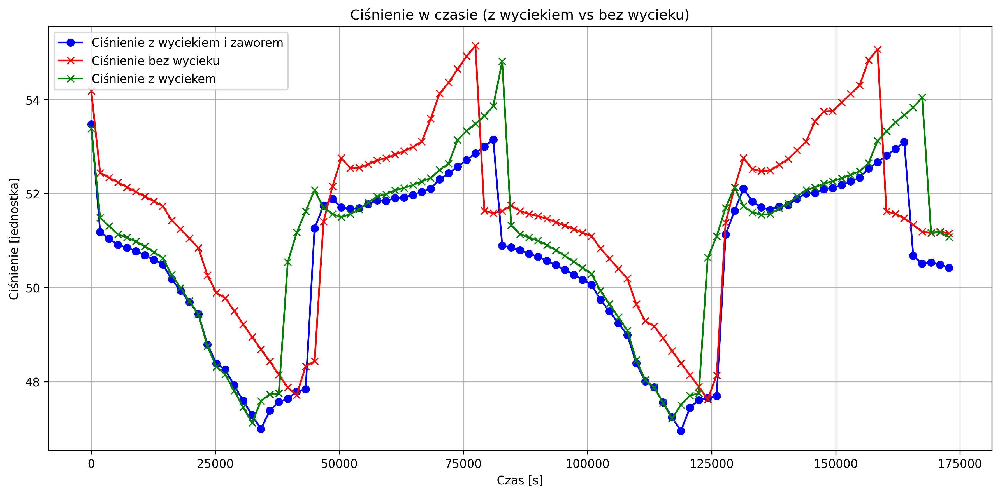

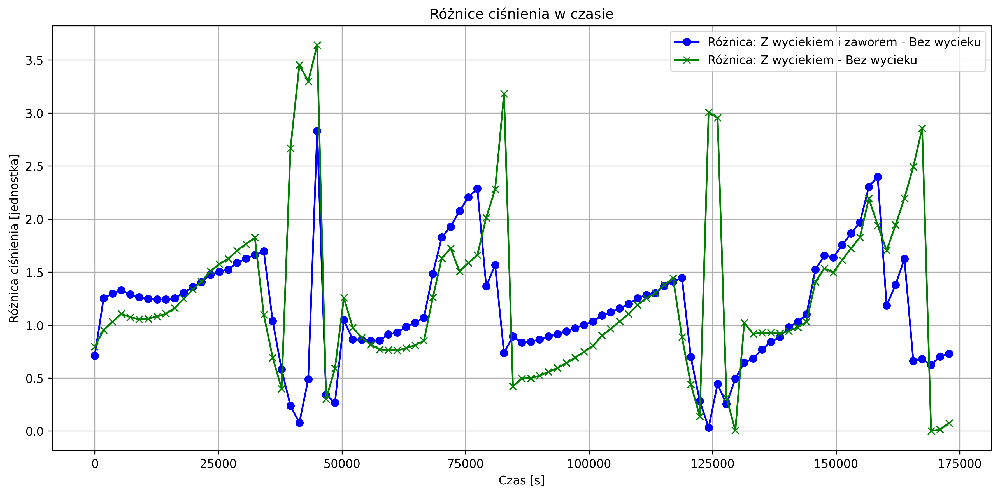

[124, 155, 90, 111, 24, 84, 83, 129, 96, 244]


In [66]:
leak_emit = 20
emit = d.getNodeEmitterCoeff()
emit = np.zeros_like(emit)

for leaknode in allleaknodes:
    leak_node_id = leaknode
    leak_node = d.getNodeIndex(leak_node_id)  # Get the node index
    emit[leak_node - 1] = leak_emit

d.setNodeEmitterCoeff(emit)

pressure_time_leak= DaneZSymulacji()
pressure_time_no_leak, pressure_time_leak = WspolnyCzas(pressure_time_no_leak, pressure_time_leak)
Wskaznik0 = OdlegloscEuklidesa(pressure_time_no_leak, pressure_time_leak)
print(f"wskaznik dla wycieku bez zaworów: {Wskaznik0}")
wskaznik_previous = Wskaznik0
BestPicks =[]


for valve_step in range(num_valves):
        print()
        print(f"Placing valve {valve_step + 1}...")

        Pick_me_pipe = 0
        wskaznik_best = wskaznik_previous
        print(f"wskaznik_best: {wskaznik_best}")


        for pipe in all_links:
                print()
                print(f"pipe: {pipe}")

                if pipe in restricted_pipes:
                      continue

                pipe_diameter = d.getLinkDiameter(pipe)
                d.setLinkDiameter(pipe, 1)
                pipe_diameterafter = d.getLinkDiameter(pipe)

                pressure_time_leak_pipe= DaneZSymulacji()
                pressure_time_no_leak, pressure_time_leak_pipe = WspolnyCzas(pressure_time_no_leak, pressure_time_leak_pipe)

                wskaznik = OdlegloscEuklidesa(pressure_time_no_leak, pressure_time_leak_pipe)
                print(f"wskaznik: {wskaznik}")

                if wskaznik <  wskaznik_best:
                        wskaznik_best = wskaznik
                        Pick_me_pipe = pipe
                        print(f"Pick_me_pipe: {Pick_me_pipe}")
                        pressure_time_leak_pipe_best = pressure_time_leak_pipe

                d.setLinkDiameter(pipe, pipe_diameter)
                pipe_diameterEND = d.getLinkDiameter(pipe)
        print(f"wskaznik_best:  {wskaznik_best}")
        if wskaznik_best >= wskaznik_previous:
                print("Wskaznik_best nie jest mniejszy niż wskaznik_previous, przerywam pętlę.")
                break

        wskaznik_previous = wskaznik_best
        print(f"Nowy wskaznik_previous: {wskaznik_previous}")

        restricted_pipes.append(Pick_me_pipe)
        BestPicks.append(Pick_me_pipe)
        d.setLinkDiameter(Pick_me_pipe, 1)
        print(f"Pick_me_pipe : {Pick_me_pipe}")
        print( d.getLinkDiameter(BestPicks))

        WykresZaworu(pressure_time_leak_pipe_best,pressure_time_no_leak,pressure_time_leak)
        pressure_time_leak_pipe_best, pressure_time_no_leak = WspolnyCzas(pressure_time_leak_pipe_best, pressure_time_no_leak)
        pressure_time_leak, pressure_time_no_leak = WspolnyCzas(pressure_time_leak, pressure_time_no_leak)
        WykresResiduum(pressure_time_leak_pipe_best,pressure_time_no_leak,pressure_time_leak)

        print(BestPicks)


[124, 155, 90, 111, 24, 84, 83, 129, 96, 244]


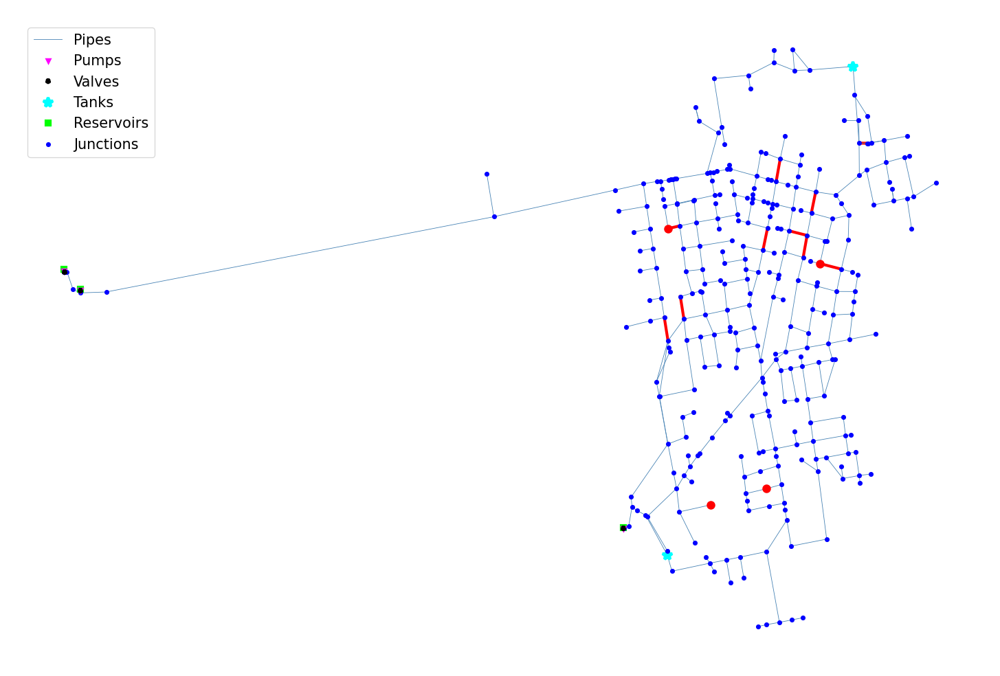

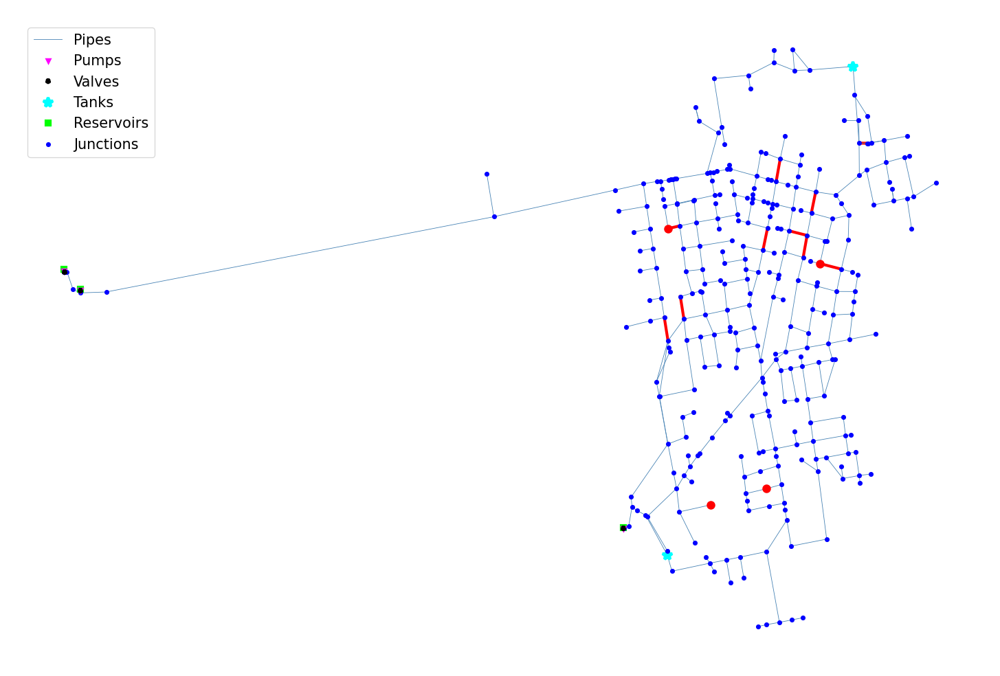

In [67]:

highlight_nodes = allleaknodes
highlight_links = BestPicks

print(BestPicks)
# Wykres sieci
d.plot(
    highlightnode=highlight_nodes,        # Węzły do wyróżnienia
    highlightlink=BestPicks,        # Rury do wyróżnienia
    fontsize=5,                           # Czcionka
    fig_size=[6, 4],                      # Rozmiar wykresu
    dpi=300,                              # Rozdzielczość
    highligthlink_linewidth=1,            # Grubość wyróżnionych rur
    highligthnode_linewidth=4,            # Grubość wyróżnionych węzłów
    colorbar_label="Values"               # Etykieta dla paska kolorów (opcjonalnie)
)
#[176, 124, 146, 155, 331, 142, 121, 216, 75, 217] zawory dla ['J211' , 'J155', 'J189', 'J56']
#[176, 124, 146, 155, 331, 142, 121, 216, 75, 217] dla ['J211' , 'J155', 'J189', 'J56']
#[210, 155, 124, 146, 278, 217, 143, 59, 171, 121] dla ['J155' , 'J236', 'J189', 'J85']
#[124, 155, 90, 111, 24, 84, 83, 129, 96, 244] dla [63, 14, 24, 179, 199, 301, 302, 128, 83, 346, 37, 243, 244, 203, 75, 322, 232, 68,
             #73, 78, 84, 90, 96, 98, 208, 345, 111, 112, 124, 116, 174, 120, 233, 126, 129, 155, 132, 133, 204, 266, 282]